In [5]:
from seticore import viewer
import numpy as np


STAMPS_PATH = "../stamp_data/example.raw.seticore.0000.stamps"

# read_stamps yields Stamp objects that bundle metadata + data-access methods
stamps_gen = viewer.read_stamps(STAMPS_PATH, find_recipe=True)
stamps = list(stamps_gen)  # now you can index or loop freely
print(f"Loaded {len(stamps)} stamps")

def extract_spectrum(stamp):
    # stamp.real_array() → ndarray of shape (time, freq, pol, ant, complex)
    arr = stamp.real_array()
    # sum over polarization, antenna, and real/imag axes for total power
    power = np.square(arr).sum(axis=(2, 3, 4))  # → shape (time, freq)
    return power

# build a stack of 2D arrays
arrays = [extract_spectrum(s) for s in stamps]

Loaded 60 stamps


In [6]:
# if resample
import numpy as np
from scipy.signal import resample
from seticore import viewer

# 1) Load stamps and extract power arrays as before:
STAMPS_PATH = "../stamp_data/example.raw.seticore.0000.stamps"
stamps_gen  = viewer.read_stamps(STAMPS_PATH, find_recipe=True)
stamps      = list(stamps_gen)

def extract_spectrum(stamp):
    arr   = stamp.real_array()             # (time, freq, pol, ant, complex)
    power = np.square(arr).sum(axis=(2,3,4))  # → (16, V_i)
    return power

arrays = [extract_spectrum(s) for s in stamps]  # list of (16, V_i) arrays

# 2) Resample each to the same width
target_W      = 512   # your fixed channel count
arrays_resamp = [
    resample(a, target_W, axis=1) 
    for a in arrays
]  # each → (16, target_W)

# 3) Stack into one 3D array
X = np.stack(arrays_resamp, axis=0)  # → (n_hits, 16, target_W)


In [78]:
# if padding
#  assume `arrays` is a list of 2D power arrays of shape (16, V_i)
widths     = [a.shape[1] for a in arrays]
target_W   = max(widths)  # or use int(np.median(widths))

def pad_or_crop(a, W=target_W):
    t, v = a.shape
    if v < W:
        pad = W - v
        return np.pad(a, ((0,0),(0,pad)), 'constant', constant_values=0)
    else:
        start = (v - W)//2
        return a[:, start:start+W]

arrays_fixed = [pad_or_crop(a) for a in arrays]
X = np.stack(arrays_fixed, axis=0)          # → (n_hits, 16, target_W)


In [7]:
# 1) Normalize globally to [0,1]
vmin, vmax = X.min(), X.max()
X_norm     = (X - vmin) / (vmax - vmin)

# 2) Add channel axis for Conv2D
X_input    = X_norm[..., np.newaxis]       # → (n_hits, 16, target_W, 1)
X_input.shape


(60, 16, 512, 1)

/home/jaym/jay-env/lib/python3.12/site-packages/keras/src/layers/core/input_layer.py:27: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gaussian_noise_3                │ (None, 16, 512, 1)     │             0 │
│ (GaussianNoise)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 16, 512, 32)    │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_18          │ (None, 16, 512, 32)    │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_18 (Activation)      │ (None, 16, 512, 32)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 8, 256, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 8, 256, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_19          │ (None, 8, 256, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_19 (Activation)      │ (None, 8, 256, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 4, 128, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 4, 128, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_20          │ (None, 4, 128, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_20 (Activation)      │ (None, 4, 128, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 2, 64, 128)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 16384)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ latent_vector (Dense)           │ (None, 32)             │       524,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 16384)          │       540,672 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_3 (Reshape)             │ (None, 2, 64, 128)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_9              │ (None, 4, 128, 128)    │       147,584 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_21          │ (None, 4, 128, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_21 (Activation)      │ (None, 4, 128, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_10             │ (None, 8, 256, 64)     │        73,792 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 1,399,585 (5.34 MB)

 Trainable params: 1,398,689 (5.34 MB)

 Non-trainable params: 896 (3.50 KB)

Epoch 1/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 569ms/step - loss: 0.2998 - val_loss: 0.1990
Epoch 2/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 271ms/step - loss: 0.2042 - val_loss: 0.1969
Epoch 3/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 272ms/step - loss: 0.1353 - val_loss: 0.1944
Epoch 4/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 256ms/step - loss: 0.0892 - val_loss: 0.1912
Epoch 5/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 279ms/step - loss: 0.0573 - val_loss: 0.1872
Epoch 6/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 274ms/step - loss: 0.0359 - val_loss: 0.1822
Epoch 7/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 252ms/step - loss: 0.0224 - val_loss: 0.1761
Epoch 8/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 252ms/step - loss: 0.0139 - val_loss: 0.1691
Epoch 9/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 278ms/step - loss: 0.0087 - val_loss: 0.1613
Epoch 10/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 279ms/step - loss: 0.0055 - val_loss: 0.1531
Epoch 11/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 254ms/step - loss: 0.0035 - val_loss: 0.1447
Epoch 12/200
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 290ms/step - loss: 0.0

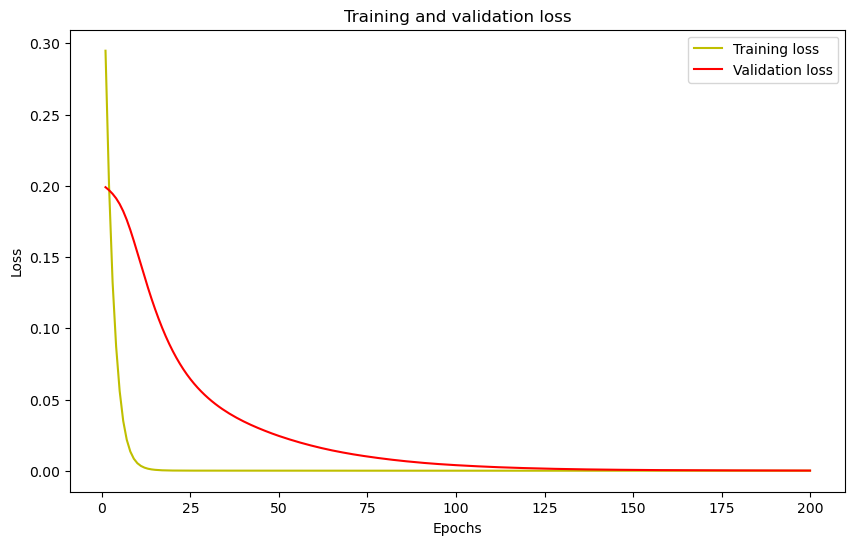

In [16]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (
    InputLayer,
    GaussianNoise,
    Conv2D,
    MaxPooling2D,
    Flatten,
    Dense,
    Reshape,
    Conv2DTranspose,
    BatchNormalization,
    Activation
)
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split

# Split data
X_train, X_val = train_test_split(X_input, test_size=0.2, random_state=42)

import matplotlib.pyplot as plt
%matplotlib inline
plt.figure(figsize=(10, 6))

# Assume target_W is 512 for this example
latent_dim = 32

model = Sequential([
    InputLayer(input_shape=(16, target_W, 1)),
    GaussianNoise(0.05),

    # ─── Encoder ─────────────────────────────────────
    Conv2D(32, (3, 3), padding='same'), BatchNormalization(), Activation('relu'),
    MaxPooling2D((2, 2), padding='same'),  # → (8, W/2, 32)

    Conv2D(64, (3, 3), padding='same'), BatchNormalization(), Activation('relu'),
    MaxPooling2D((2, 2), padding='same'),  # → (4, W/4, 64)

    Conv2D(128, (3, 3), padding='same'), BatchNormalization(), Activation('relu'),
    MaxPooling2D((2, 2), padding='same'),  # → (2, W/8, 128)

    Flatten(),
    Dense(latent_dim, name="latent_vector"),

    # ─── Decoder ─────────────────────────────────────
    Dense(2 * (target_W // 8) * 128),  # reshape back to conv shape
    Reshape((2, target_W // 8, 128)),

    Conv2DTranspose(128, (3, 3), strides=(2, 2), padding='same'), BatchNormalization(), Activation('relu'),  # → (4, W/4, 128)
    Conv2DTranspose(64,  (3, 3), strides=(2, 2), padding='same'), BatchNormalization(), Activation('relu'),  # → (8, W/2, 64)
    Conv2DTranspose(32,  (3, 3), strides=(2, 2), padding='same'), BatchNormalization(), Activation('relu'),  # → (16, W, 32)

    Conv2D(1, (3, 3), activation='sigmoid', padding='same')  # final output shape → (16, W, 1)
])

model.compile(optimizer='adam', loss='mse')
model.summary()

# Add noise for denoising training
X_noisy = X_train + np.random.normal(0, 0.02, X_train.shape)
X_noisy = np.clip(X_noisy, 0, 1)

# ─── Train the model ────────────────────────────────
history = model.fit(
    X_noisy, X_train,
    epochs=200,
    batch_size=32,
    validation_data=(X_val, X_val),
    shuffle=True,
    callbacks=[EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)]
)

# ─── Plot loss curves ───────────────────────────────
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step


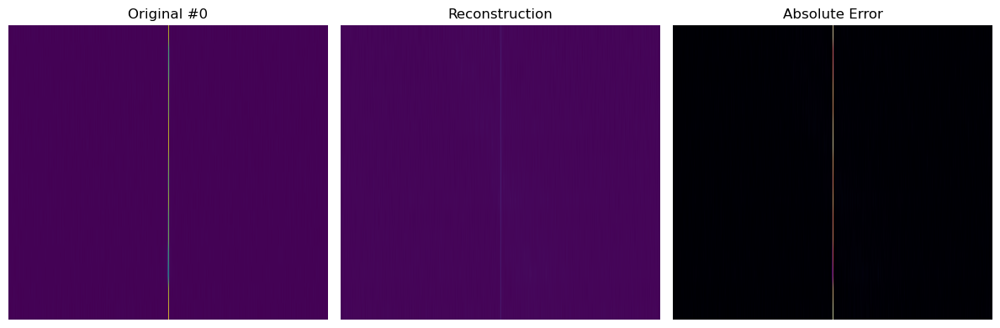

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


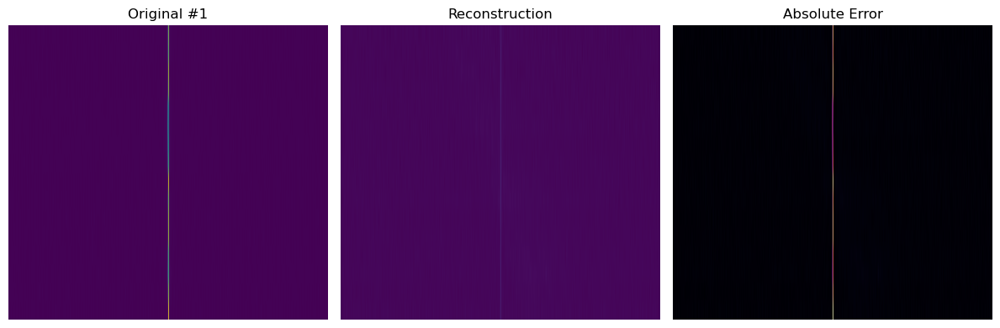

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


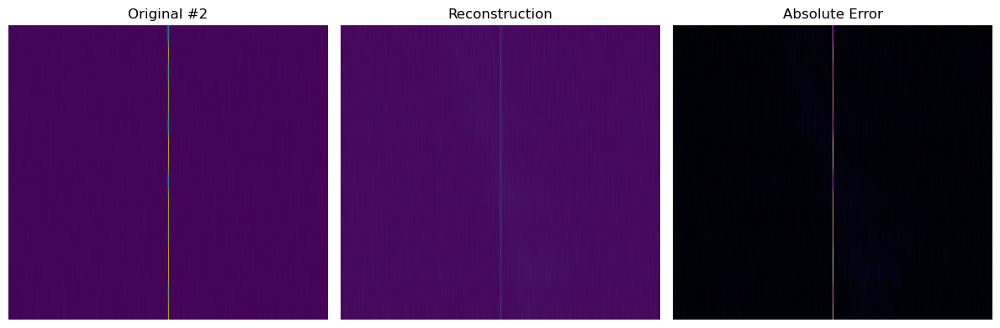

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


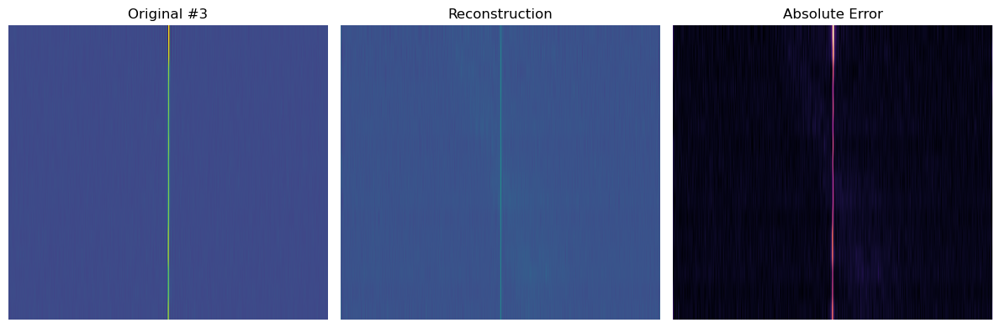

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


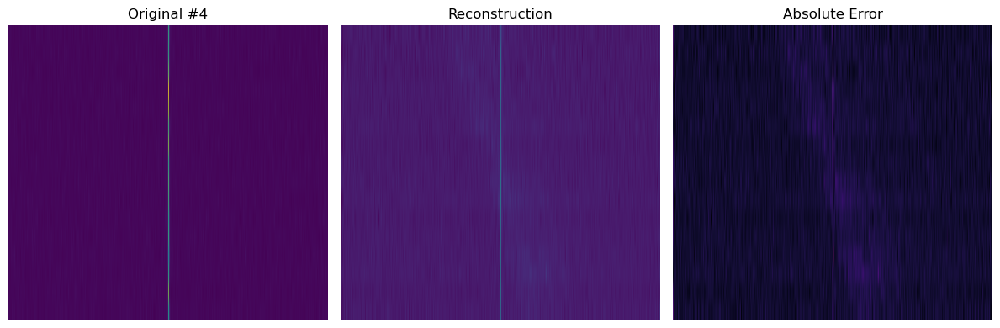

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


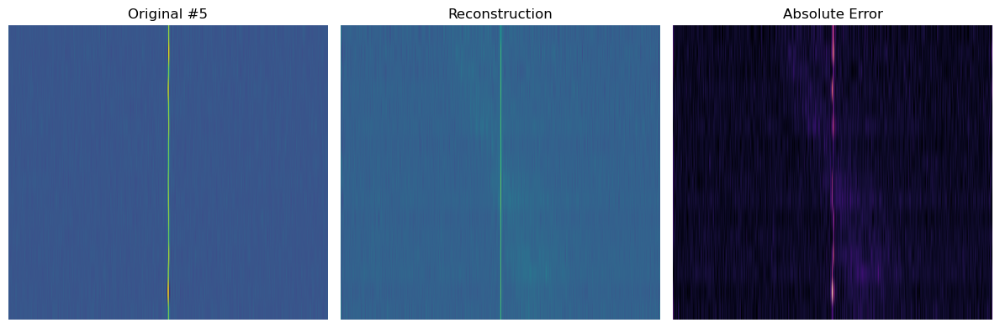

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


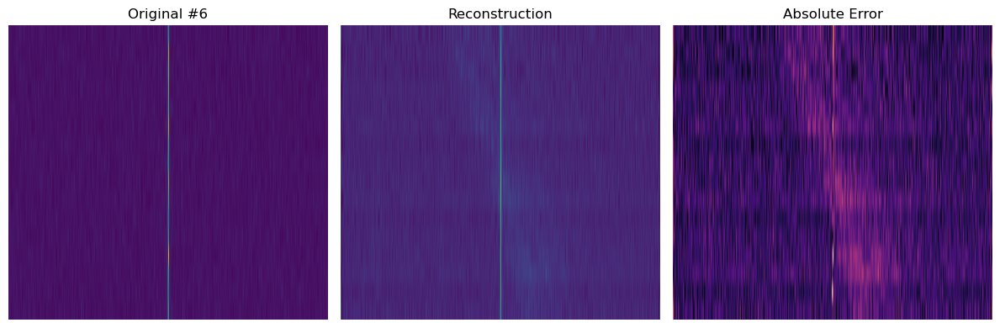

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


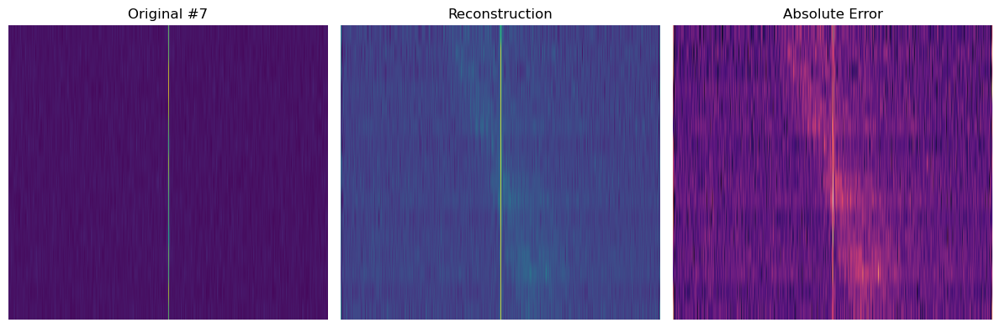

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


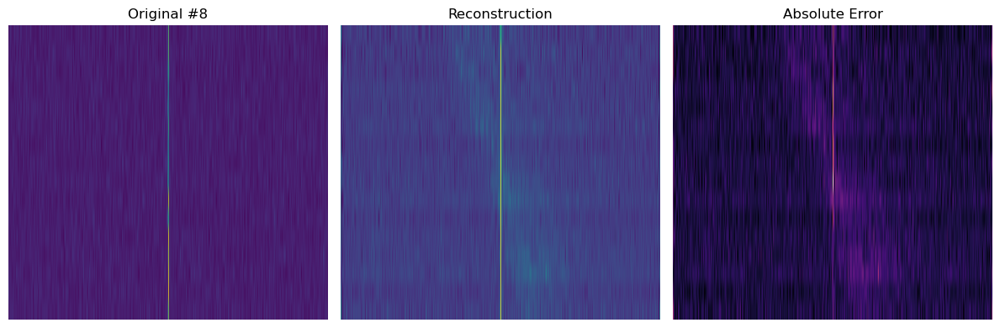

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


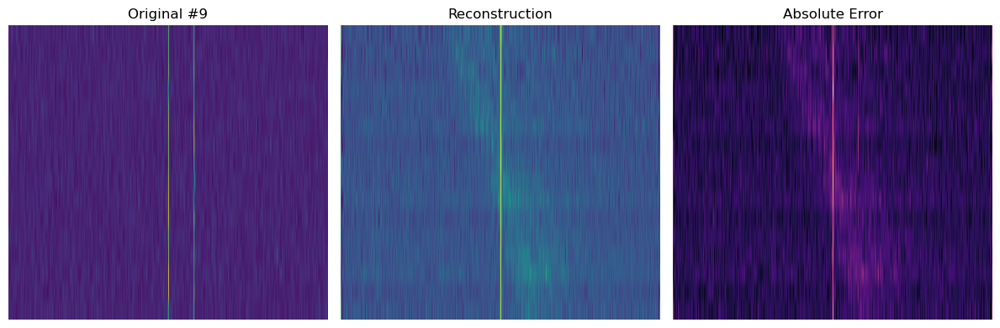

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


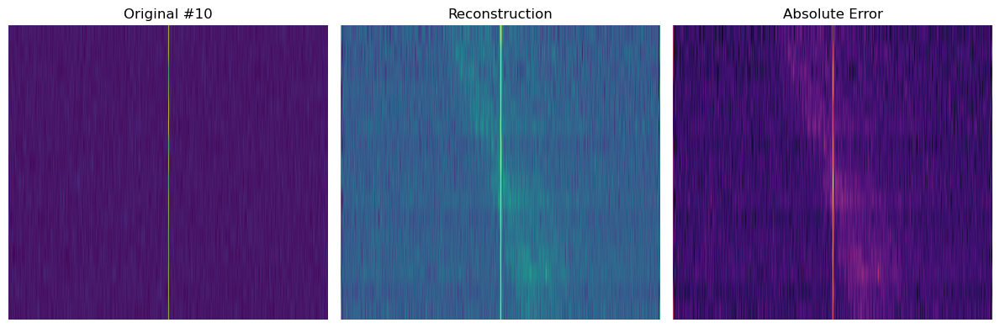

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


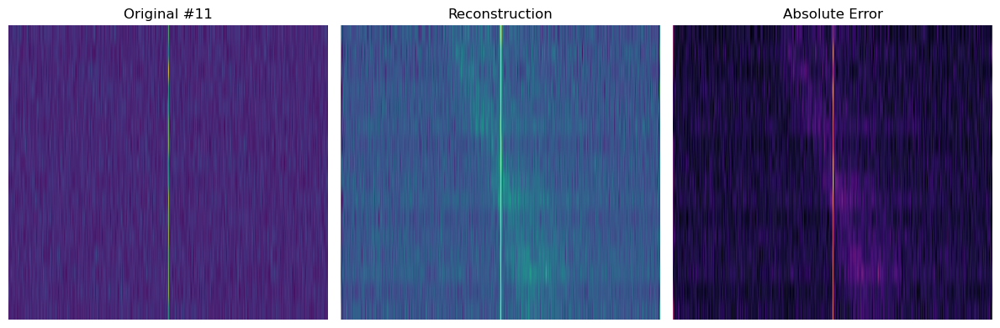

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


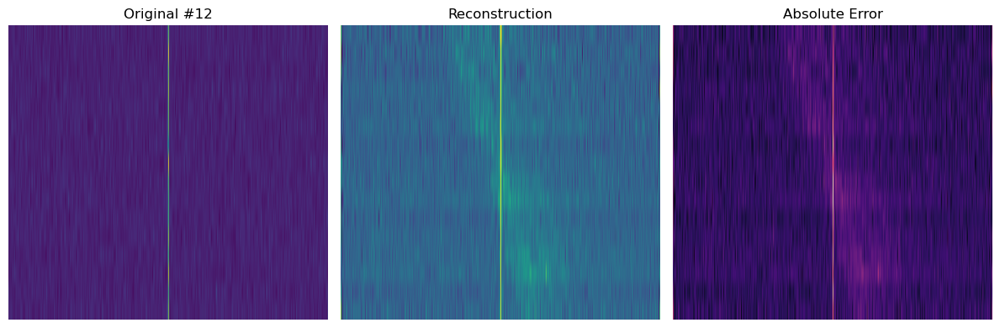

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


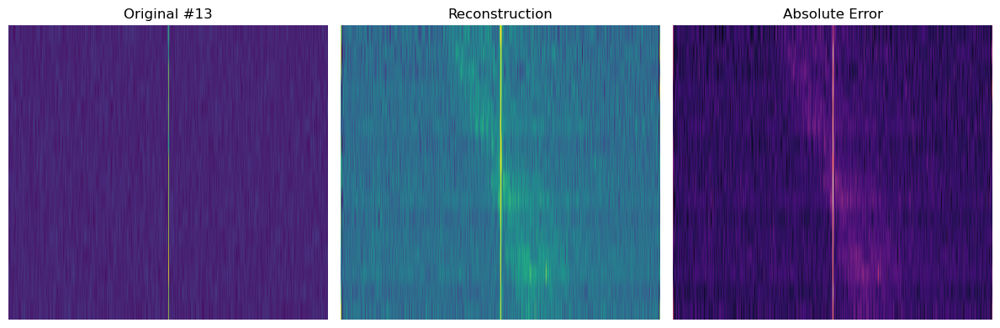

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


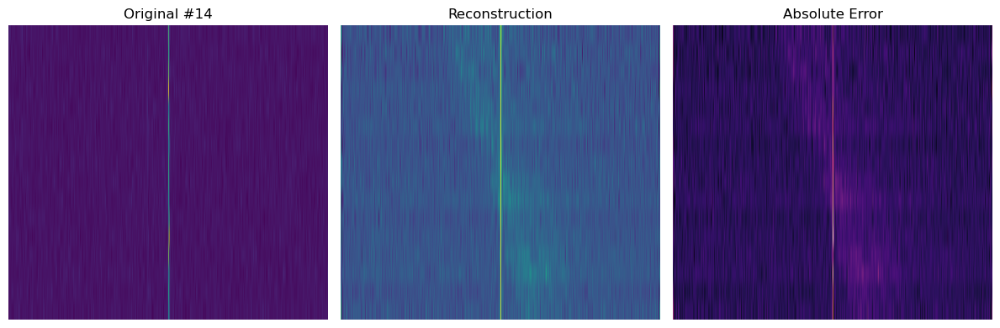

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


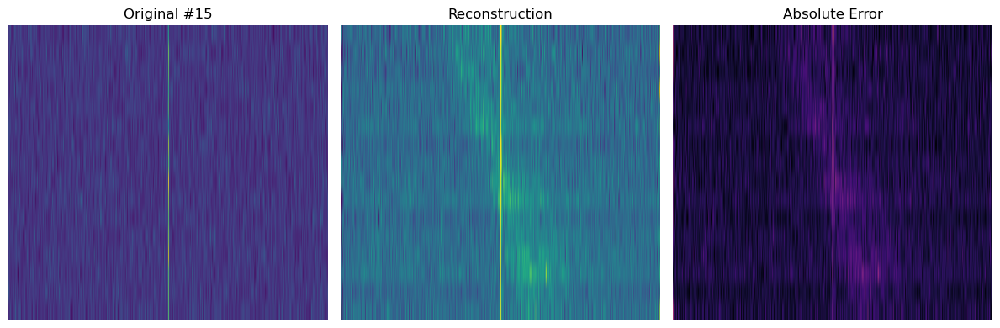

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


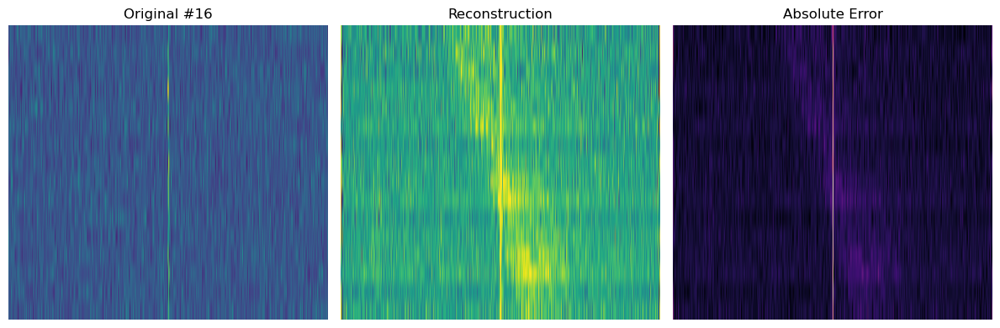

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


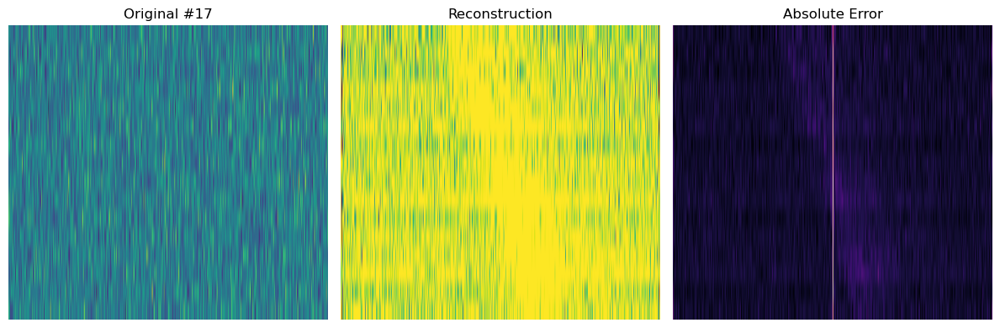

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


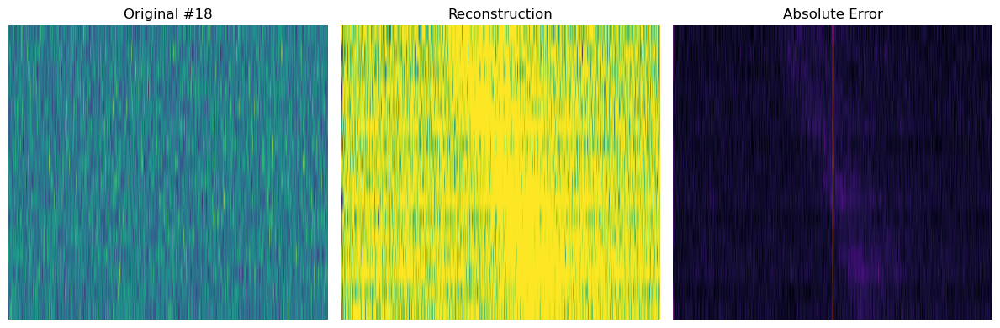

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


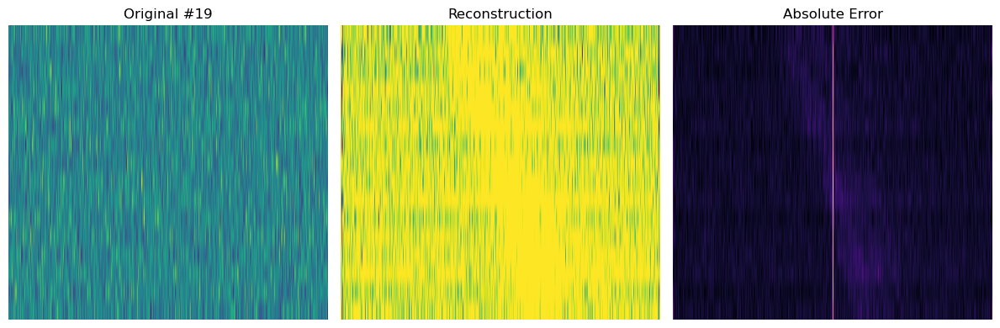

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


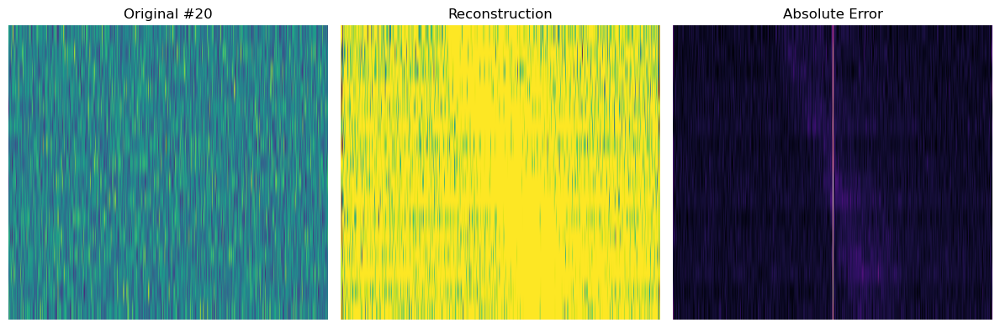

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


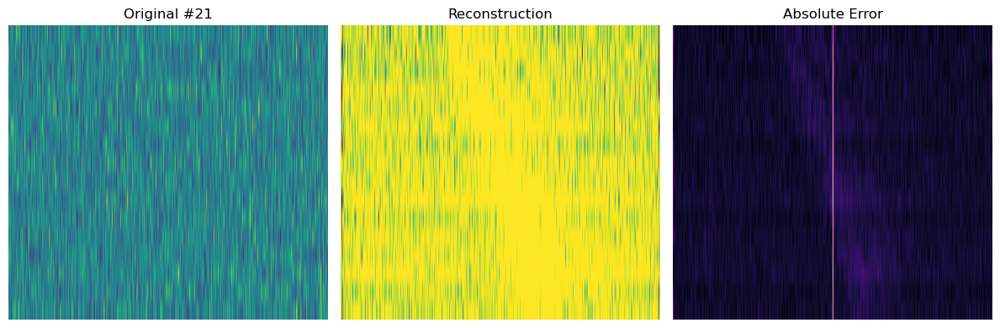

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


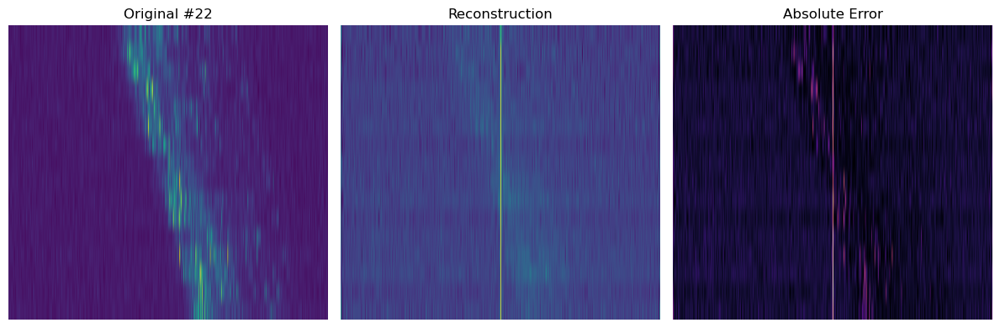

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


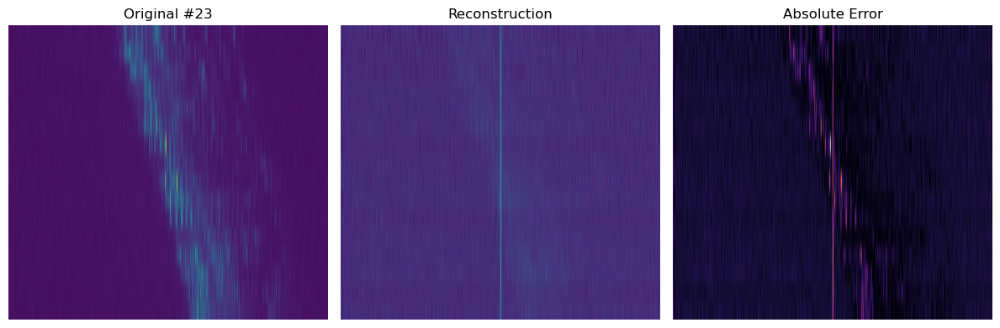

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


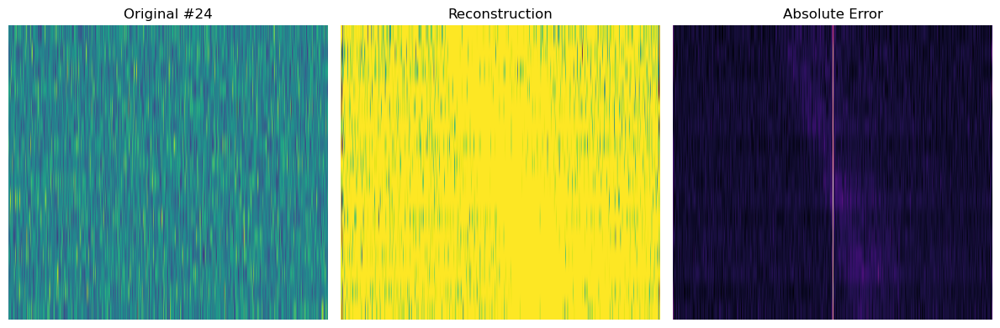

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


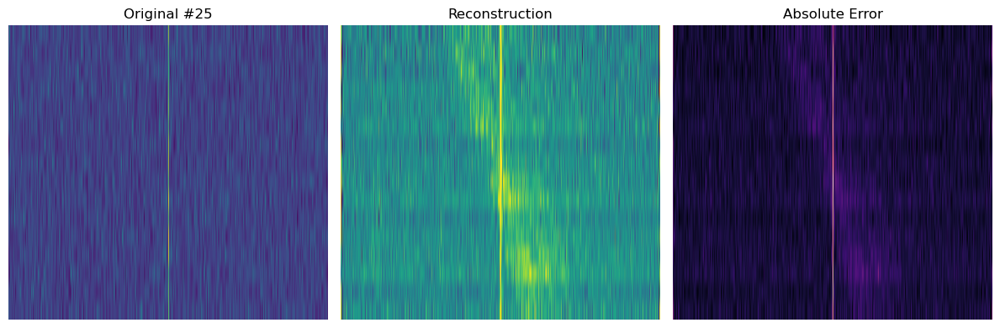

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


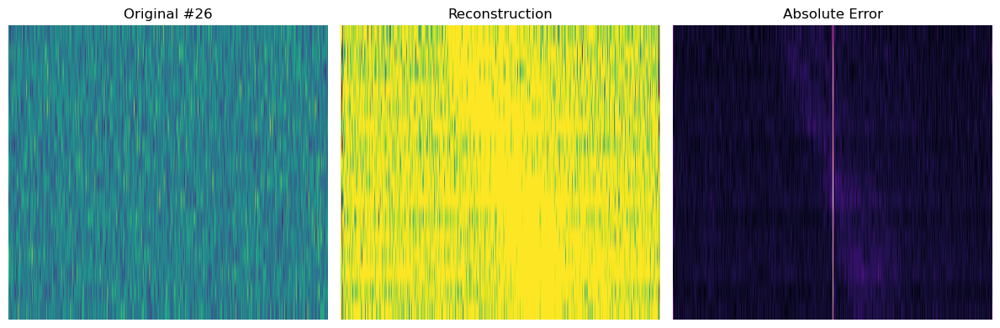

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


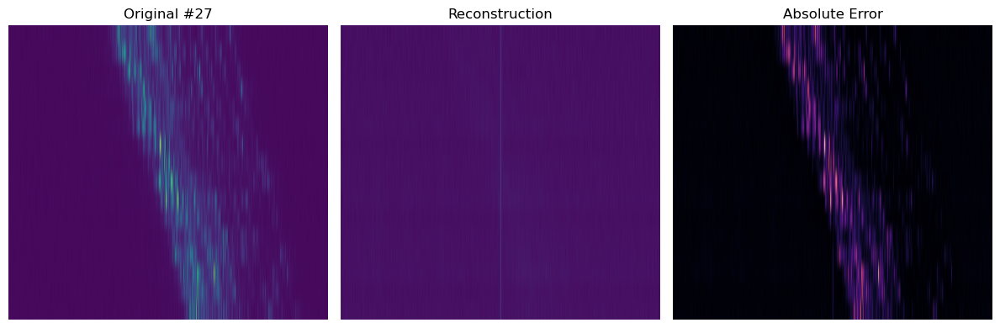

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


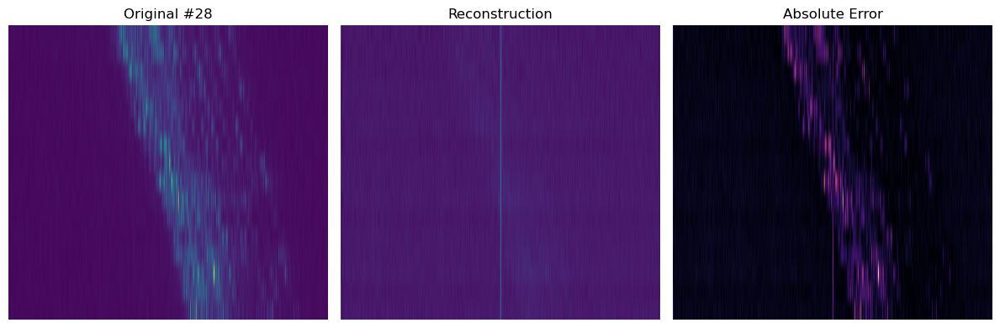

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


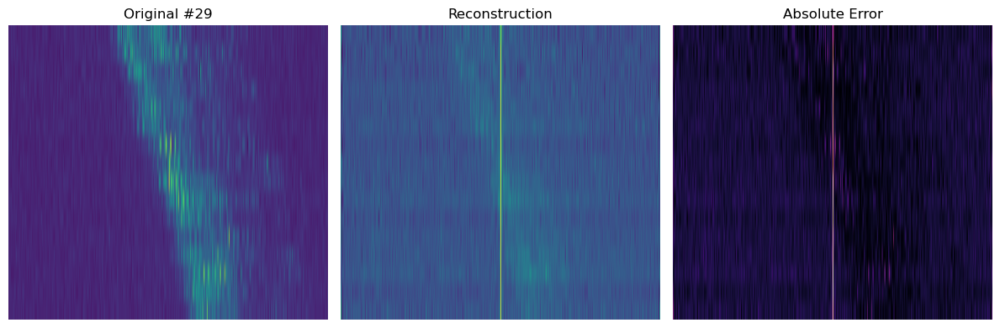

In [18]:
max_images = 30  # Change this to control how many examples to show

for i in range(min(len(X_input), max_images)):
    orig = X_input[i, ..., 0]
    recon = model.predict(X_input[i:i+1])[0, ..., 0]

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))
    vmin, vmax = orig.min(), orig.max()

    ax1.imshow(orig, aspect='auto', vmin=vmin, vmax=vmax)
    ax1.set_title(f'Original #{i}')
    ax1.axis('off')

    ax2.imshow(recon, aspect='auto', vmin=vmin, vmax=vmax)
    ax2.set_title('Reconstruction')
    ax2.axis('off')

    ax3.imshow(np.abs(orig - recon), aspect='auto', cmap='magma')
    ax3.set_title('Absolute Error')
    ax3.axis('off')

    plt.tight_layout()
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


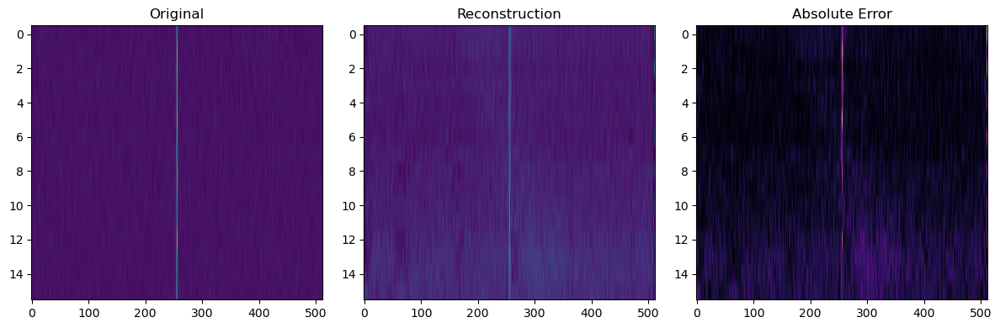

In [11]:
i = np.random.randint(len(X_input))
orig = X_input[i,...,0]
recon = model.predict(X_input[i:i+1])[0,...,0]

fig, (ax1,ax2,ax3) = plt.subplots(1,3,figsize=(12,4))
vmin, vmax = orig.min(), orig.max()

ax1.imshow(orig, aspect='auto', vmin=vmin, vmax=vmax)
ax1.set_title('Original')

ax2.imshow(recon, aspect='auto', vmin=vmin, vmax=vmax)
ax2.set_title('Reconstruction')

ax3.imshow(np.abs(orig-recon), aspect='auto', cmap='magma')
ax3.set_title('Absolute Error')

plt.tight_layout()


In [ ]:
# Manually slice up to and including the latent_vector layer
latent_layer_index = [i for i, l in enumerate(model.layers) if l.name == "latent_vector"][0]
encoder = Sequential(model.layers[:latent_layer_index + 1])

# Predict latent vectors
latent_vectors = encoder.predict(X_input, batch_size=128)
print(latent_vectors.shape)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
(60, 32)


Latent vector shape: (60, 32)


/home/jaym/jay-env/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


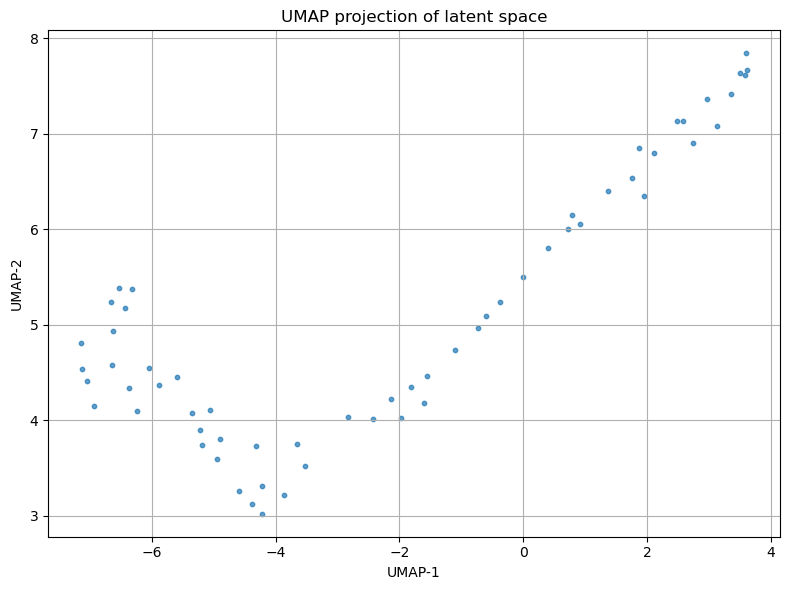

In [23]:
print(f"Latent vector shape: {latent_vectors.shape}")  # → (n_samples, latent_dim)

# Reduce to 2D with UMAP
import umap.umap_ as umap
reducer = umap.UMAP(n_components=2, random_state=42)
latent_2d = reducer.fit_transform(latent_vectors)

# Plot with matplotlib
plt.figure(figsize=(8, 6))
plt.scatter(latent_2d[:, 0], latent_2d[:, 1], s=10, alpha=0.7)
plt.title("UMAP projection of latent space")
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.grid(True)
plt.tight_layout()
plt.show()
